In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/store-sales-time-series-forecasting/oil.csv
/kaggle/input/store-sales-time-series-forecasting/sample_submission.csv
/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv
/kaggle/input/store-sales-time-series-forecasting/stores.csv
/kaggle/input/store-sales-time-series-forecasting/train.csv
/kaggle/input/store-sales-time-series-forecasting/test.csv
/kaggle/input/store-sales-time-series-forecasting/transactions.csv


# Imports
___

### *All the imports lay here:*

In [2]:
import warnings
warnings.simplefilter("ignore")

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from math import ceil

import ipywidgets as widgets
from IPython.display import clear_output,display_markdown

from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression,ElasticNet, Lasso, Ridge
from sklearn.model_selection import train_test_split
from sklearn.multioutput import RegressorChain
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor

from xgboost import XGBRegressor
from pyearth import Earth

from learntools.time_series.utils import plot_lags, make_lags, make_leads, plot_periodogram,plot_multistep,make_multistep_target
import scipy.stats as st
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess


In [3]:
def plot_periodogram(ts,For=None, detrend='linear', ax=None,color='purple'):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color=color)
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    if For==None:
        ax.set_title("Periodogram")
    else:
        ax.set_title(f"Periodogram for: {For}")
    return ax
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)

### Reading the dataset files
___

In [4]:
holidays=pd.read_csv('../input/store-sales-time-series-forecasting/holidays_events.csv',parse_dates=['date'],infer_datetime_format=True)
oil=pd.read_csv('../input/store-sales-time-series-forecasting/oil.csv')
stores=pd.read_csv('../input/store-sales-time-series-forecasting/stores.csv',dtype={'store_nbr':'category'})
test=pd.read_csv('../input/store-sales-time-series-forecasting/test.csv',\
                     dtype={
        'store_nbr': 'category',
        'family': 'category',
        'onpromotion': 'float'},
                 parse_dates=['date'],
                 infer_datetime_format=True
                )
train=pd.read_csv('../input/store-sales-time-series-forecasting/train.csv',\
                     dtype={
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
        'onpromotion': 'uint32',
    },
    parse_dates=['date'],
    infer_datetime_format=True)
transactions=pd.read_csv('../input/store-sales-time-series-forecasting/transactions.csv',parse_dates=['date'],infer_datetime_format=True)

## Quick Look at the data
___


In [5]:
datasets=[holidays,oil,stores,test,train,transactions]
datasets_names=['holidays','oil','stores','test','train','transactions']
data_tabs = widgets.Tab([widgets.Output() for _ in enumerate(datasets)])
for i, df in enumerate(datasets):
    data_tabs.set_title(i, f'{datasets_names[i]}')
    with data_tabs.children[i]:
        display_markdown('''# Head: ''',raw=True)
        display(df.head())
        display_markdown('''# Tail:''',raw=True)
        display(df.tail())
        display_markdown('''# Datatypes:''',raw=True)
        display(df.dtypes.to_frame(name='datatype').transpose())
display(data_tabs)

### From the test data we can see that we have to do a 15 day forecast.

## Let's merge 'holidays' table with 'train' on 'date' as holidays could be indicators to seasonality.

We want all the data that matches the holidays date and also the ones that don't.

In [6]:
df=pd.merge(train,holidays,how='left',on='date')
df.head()

,id,date,store_nbr,family,sales,onpromotion,type,locale,locale_name,description,transferred
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False
1,1,2013-01-01,1,BABY CARE,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False
2,2,2013-01-01,1,BEAUTY,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False
3,3,2013-01-01,1,BEVERAGES,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False
4,4,2013-01-01,1,BOOKS,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False


The ones that don't match with holidays date are going to have some NA values. Let's look for missing values. 

In [7]:
df.isnull().sum().to_frame(name='missing').transpose()

,id,date,store_nbr,family,sales,onpromotion,type,locale,locale_name,description,transferred
missing,0,0,0,0,0,0,2551824,2551824,2551824,2551824,2551824


# Fill NaN values in column = ```type```. 
Renaming `NaN` values in `type` as `Normal`
We could replace them with `Work Day` but that could create some unnecessary bias in our intuition. For now let's just assume they are `Normal` days.

In [8]:
df['type']=df['type'].fillna('Normal')
for i in df.type.unique():
    display_markdown(f'''* {i}''',raw=True)

* Holiday

* Normal

* Work Day

* Additional

* Event

* Transfer

* Bridge

In [9]:
df.isnull().sum().to_frame(name='missing').transpose()

,id,date,store_nbr,family,sales,onpromotion,type,locale,locale_name,description,transferred
missing,0,0,0,0,0,0,0,2551824,2551824,2551824,2551824


### Dropping columns:  `locale`, `locale_name`, `description`, `transferred` as we can't replace the missing values in them with anything rational, hence it is wise to do so.

In [10]:
df=df.dropna(axis=1)
df.isnull().sum().to_frame(name='missing').transpose()

,id,date,store_nbr,family,sales,onpromotion,type
missing,0,0,0,0,0,0,0


# **Renaming column name `type` to `day_type`**

```python:
dataframe.rename(columns = {'old_col1':'new_col1', 'old_col2':'new_col2'}, inplace = True)
```

In [11]:
df.rename(columns = {'type':'day_type'}, inplace = True)
display(df.sample(5))

,id,date,store_nbr,family,sales,onpromotion,day_type
1730506,1705558,2015-08-18,14,LADIESWEAR,0.0,0,Normal
1730204,1705256,2015-08-17,6,HARDWARE,0.0,0,Normal
1195606,1179568,2014-10-25,6,HOME AND KITCHEN II,6.0,0,Normal
2710963,2664631,2017-02-08,24,GROCERY II,17.0,1,Normal
1415112,1395510,2015-02-25,15,CELEBRATION,0.0,0,Normal


# **Merging with `stores` dataset on `store_nbr`**
___
We want to be able to acquire further informations on stores to analyse the sales based on the specifics.

In [12]:
# 'stores' dataset has 'store_nbr' column which is related to the 'store_nbr' of 'df' dataset
df=pd.merge(df,stores,how='left',on='store_nbr')
# let's check our newly acquired data 
display(df.head())

,id,date,store_nbr,family,sales,onpromotion,day_type,city,state,type,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,Holiday,Quito,Pichincha,D,13
1,1,2013-01-01,1,BABY CARE,0.0,0,Holiday,Quito,Pichincha,D,13
2,2,2013-01-01,1,BEAUTY,0.0,0,Holiday,Quito,Pichincha,D,13
3,3,2013-01-01,1,BEVERAGES,0.0,0,Holiday,Quito,Pichincha,D,13
4,4,2013-01-01,1,BOOKS,0.0,0,Holiday,Quito,Pichincha,D,13


# **Renaming column name `type` to `store_type`**
___
```python:
dataframe.rename(columns = {'old_col1':'new_col1', 'old_col2':'new_col2'}, inplace = True)
```

In [13]:
df.rename(columns={'type':'store_type'},inplace = True)
display(df.head())

,id,date,store_nbr,family,sales,onpromotion,day_type,city,state,store_type,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,Holiday,Quito,Pichincha,D,13
1,1,2013-01-01,1,BABY CARE,0.0,0,Holiday,Quito,Pichincha,D,13
2,2,2013-01-01,1,BEAUTY,0.0,0,Holiday,Quito,Pichincha,D,13
3,3,2013-01-01,1,BEVERAGES,0.0,0,Holiday,Quito,Pichincha,D,13
4,4,2013-01-01,1,BOOKS,0.0,0,Holiday,Quito,Pichincha,D,13


### Check for any potential missing values

In [14]:
df.isnull().sum().to_frame(name='missing').transpose()

,id,date,store_nbr,family,sales,onpromotion,day_type,city,state,store_type,cluster
missing,0,0,0,0,0,0,0,0,0,0,0


### Date Period and Indexing

In [15]:
# Copying the df - dataframe so that we can keep it intact in the process to check back
data=df.copy()
#changing date to period of days - 'D' 

# let's check datatypes for reassurance
data.dtypes.to_frame(name='dtypes').transpose()

,id,date,store_nbr,family,sales,onpromotion,day_type,city,state,store_type,cluster
dtypes,int64,datetime64[ns],category,category,float32,uint32,object,object,object,object,int64


### Encoding categorical data
___

In [16]:
le=LabelEncoder()

for i in df.select_dtypes(include=['object']):
    data[i]=le.fit_transform(data[i])

In [17]:
data.head()

,id,date,store_nbr,family,sales,onpromotion,day_type,city,state,store_type,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,3,18,12,3,13
1,1,2013-01-01,1,BABY CARE,0.0,0,3,18,12,3,13
2,2,2013-01-01,1,BEAUTY,0.0,0,3,18,12,3,13
3,3,2013-01-01,1,BEVERAGES,0.0,0,3,18,12,3,13
4,4,2013-01-01,1,BOOKS,0.0,0,3,18,12,3,13


# Exploratory Data Analysis (EDA)
___ 

Using ACF and PACF plots to explore patterns is a good way to start testing the stationarity and randomness in the data.

But first we have to filter the dataset in certain groups so that we are quick to understand if the data are Autocorrelated and showing patterns due to being in a certain group or they are just randomly appearing in the scene.

We could start by looking at categorically driven data:
1. Sales on Product ```family```.
2. Sales on a particular ```store_type```.
3. Sales on a particular ```store_nbr```.

etc.

<h1 align="center"> Part: 1 </h1>

___

## **Grouping sales By ```family```**
___

In [18]:
family_sales=data.copy()
family_sales['date'] = family_sales.date.dt.to_period('D')
family_sales=family_sales.set_index(['store_nbr', 'family','date']).sort_index()
family_sales=(
    family_sales
    .groupby(['family','date'])
    .mean() 
    .unstack('family')
    .loc['2017', ['sales', 'onpromotion']]
)
family_sales.head()

sales                                              \
family     AUTOMOTIVE BABY CARE     BEAUTY    BEVERAGES     BOOKS   
date                                                                
2017-01-01   0.092593  0.037037   0.055556    74.222221  0.000000   
2017-01-02  11.481482  0.259259  11.648149  6208.055664  0.481481   
2017-01-03   8.296296  0.296296   7.185185  4507.814941  0.814815   
2017-01-04   6.833333  0.333333   6.888889  3911.833252  0.759259   
2017-01-05   6.333333  0.351852   5.925926  3258.796387  0.407407   

                                                                           \
family     BREAD/BAKERY CELEBRATION     CLEANING        DAIRY        DELI   
date                                                                        
2017-01-01     9.084685    0.129630     7.500000    11.518518    3.629167   
2017-01-02   844.836304   14.203704  2233.648193  1545.000000  539.114807   
2017-01-03   665.124084   10.629630  1711.907349  1204.203735  404.300079   
2017-01-04   594.160583   11.185185  1508.036987  1107.796265  309.397675   
2017-01-05   495.511597   12.444445  1241.833374   829.277771  260.776489   

            ... onpromotion                                       \
family      ...   MAGAZINES     MEATS PERSONAL CARE PET SUPPLIES   
date        ...                                                    
2017-01-01  ...         0.0  0.018519      0.111111     0.018519   
2017-01-02  ...         0.0  0.462963     10.592593     0.537037   
2017-01-03  ...         0.0  0.481481      9.722222     0.444444   
2017-01-04  ...         0.0  0.370370     12.037037     0.444444   
2017-01-05  ...         0.0  8.981481      5.666667     0.000000   

                                                                         \
family     PLAYERS AND ELECTRONICS   POULTRY PREPARED FOODS     PRODUCE   
date                                                                      
2017-01-01                     0.0  0.000000       0.037037    0.129630   
2017-01-02                     0.0  0.259259       1.166667    5.629630   
2017-01-03                     0.0  0.388889       1.351852   56.296296   
2017-01-04                     0.0  0.296296       5.444444  101.277778   
2017-01-05                     0.0  0.296296       0.907407    5.018519   

                                                 
family     SCHOOL AND OFFICE SUPPLIES   SEAFOOD  
date                                             
2017-01-01                        0.0  0.000000  
2017-01-02                        0.0  0.407407  
2017-01-03                        0.0  0.407407  
2017-01-04                        0.0  0.333333  
2017-01-05                        0.0  0.444444  

[5 rows x 66 columns]

Acquiring sales and onpromotion separately:

In [19]:
X_family_s=family_sales.sales
X_family_p=family_sales.onpromotion

### Periodogram
___

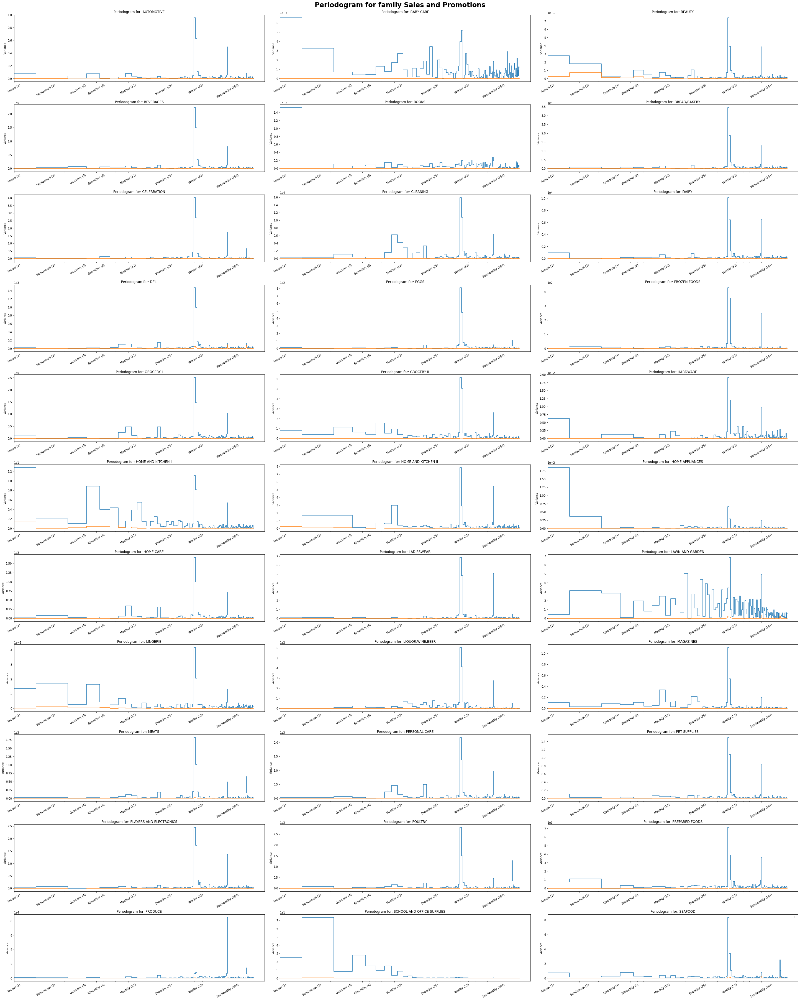

In [20]:
cols=3
rows=11
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(40, 50),sharex=False,sharey=False,constrained_layout=True)
fig.suptitle("Periodogram for family Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_family_s.columns)
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    # filter df for ticker and plot on specified axes
    plot_periodogram(X_family_s[ticker],For=ticker,ax=ax,color='C0') # fit fourier Ture
    plot_periodogram(X_family_p[ticker],For=ticker,ax=ax,color='C1') # alpha If a number is given, the confidence intervals for the given level are returned. For instance if alpha=.05, 95 % confidence intervals are returned where the standard deviation is computed according to Bartlett’s formula.
    plt.legend()

### **ACF Plot**
___

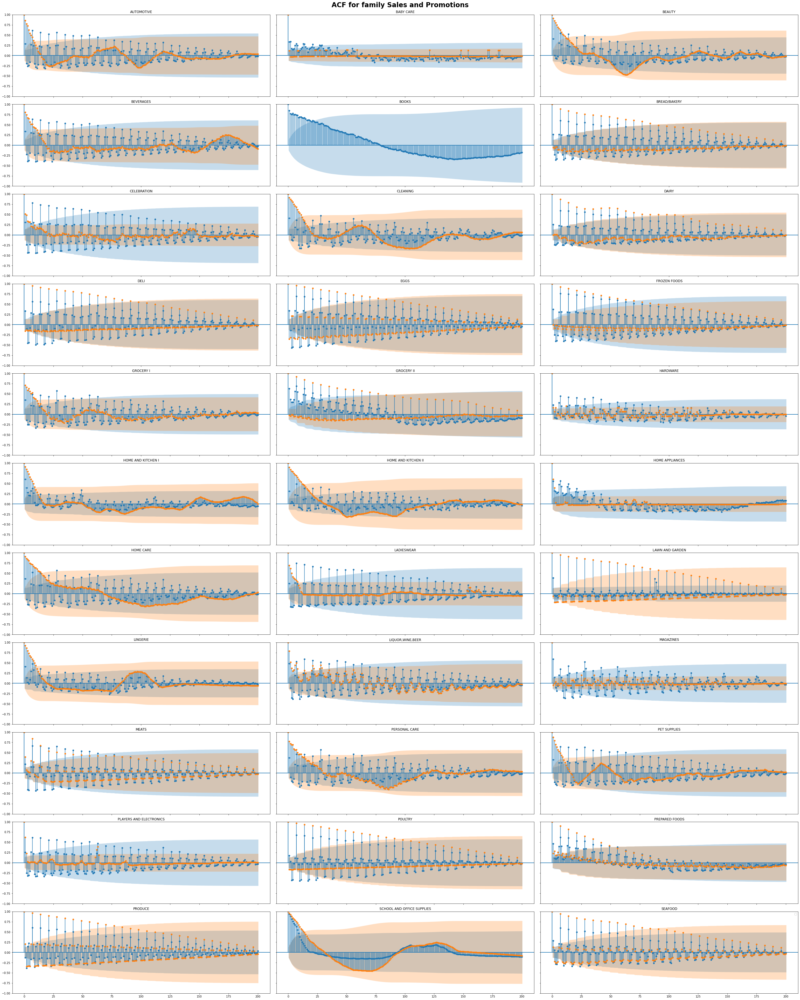

In [21]:
cols=3
rows=11
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(40, 50),sharex=True,sharey=True,constrained_layout=True)
fig.suptitle("ACF for family Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_family_s.columns)
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    # filter df for ticker and plot on specified axes
    plot_acf(X_family_s[ticker],alpha=.05,title=ticker,fft=True,lags=200,ax=ax) # fit fourier Ture
    plot_acf(X_family_p[ticker],alpha=.05,title=ticker,fft=True,lags=200,ax=ax) # alpha If a number is given, the confidence intervals for the given level are returned. For instance if alpha=.05, 95 % confidence intervals are returned where the standard deviation is computed according to Bartlett’s formula.
    plt.legend()

<h1 align="center"> Part: 2 </h1>

___

# **Grouping sales by ```store_type```**
___

Let's see if there's any patterns to be found in grouping sales by ```store_type```

In [22]:
storewise_sales=data.copy()
storewise_sales['date'] = storewise_sales.date.dt.to_period('D')
storewise_sales=storewise_sales.set_index(['store_nbr', 'store_type','date']).sort_index()
storewise_sales=(
    storewise_sales
    .groupby(['store_type','date'])
    .mean() 
    .unstack('store_type')
    .loc['2017', ['sales', 'onpromotion']]
)

Acquiring sales and onpromotion separately:

In [23]:
X_store_s=storewise_sales.sales
X_store_p=storewise_sales.onpromotion

### Periodogram for ```store_type``` 
___


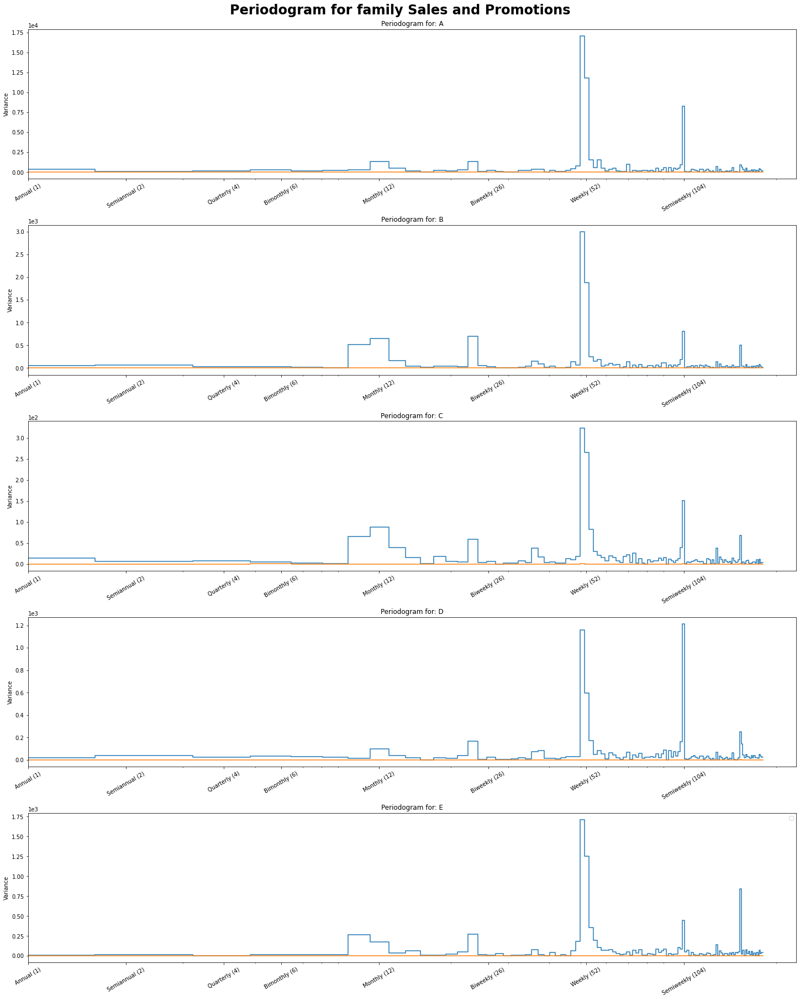

In [24]:
cols=1
rows=5
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 25),sharex=False,sharey=False,constrained_layout=True)
fig.suptitle("Periodogram for family Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_store_s.columns)
colnames=['A','B','C','D','E']
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    # filter df for ticker and plot on specified axes
    plot_periodogram(X_store_s[ticker],For=colnames[ticker],ax=ax,color='C0') # fit fourier Ture
    plot_periodogram(X_store_p[ticker],For=colnames[ticker],ax=ax,color='C1') # alpha If a number is given, the confidence intervals for the given level are returned. For instance if alpha=.05, 95 % confidence intervals are returned where the standard deviation is computed according to Bartlett’s formula.
    plt.legend()

### ACF Plot for ```store_type```
___

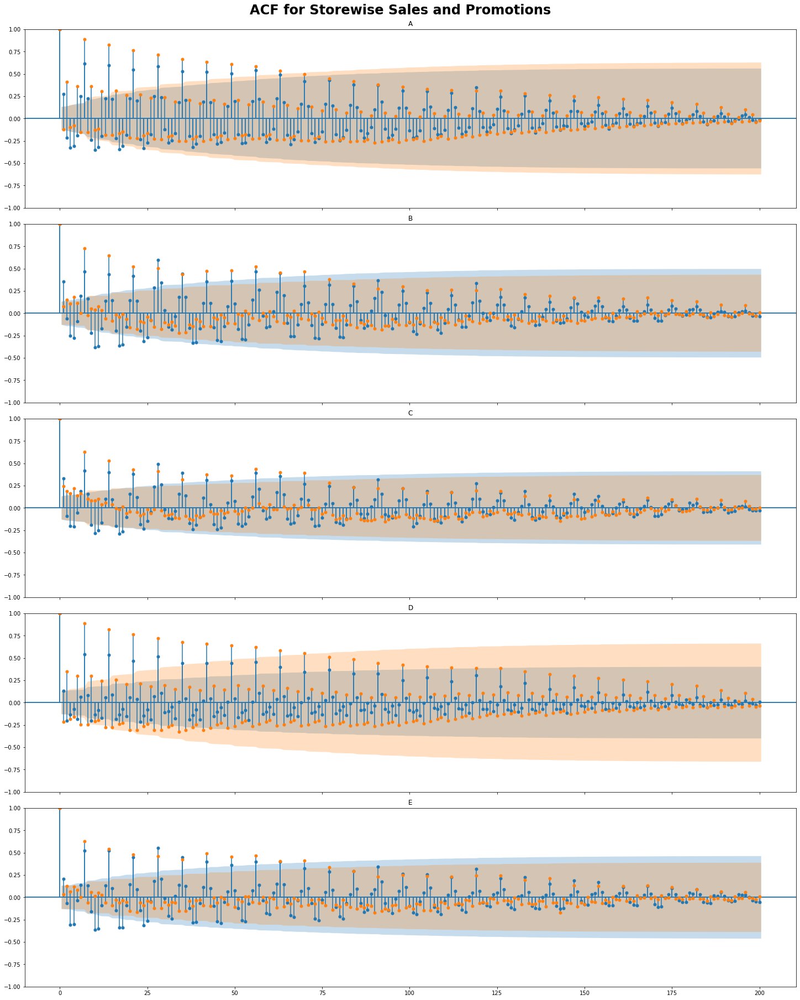

In [25]:
cols=1
rows=5
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 25),sharex=True,sharey=True,constrained_layout=True)
fig.suptitle("ACF for Storewise Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_store_s.columns)
colnames=['A','B','C','D','E']
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    plot_acf(X_store_s[ticker],alpha=0.05,title=colnames[ticker],fft=False,lags=200,ax=ax)# fast fourier transform 
    plot_acf(X_store_p[ticker],alpha=.05,title=colnames[ticker],fft=False,lags=200,ax=ax) # alpha If a number is given, the confidence intervals for the given level are returned. For instance if alpha=.05, \95 % confidence intervals are returned where the standard deviation is computed according to Bartlett’s formula.

### PACF Plot for ```store_type```
___

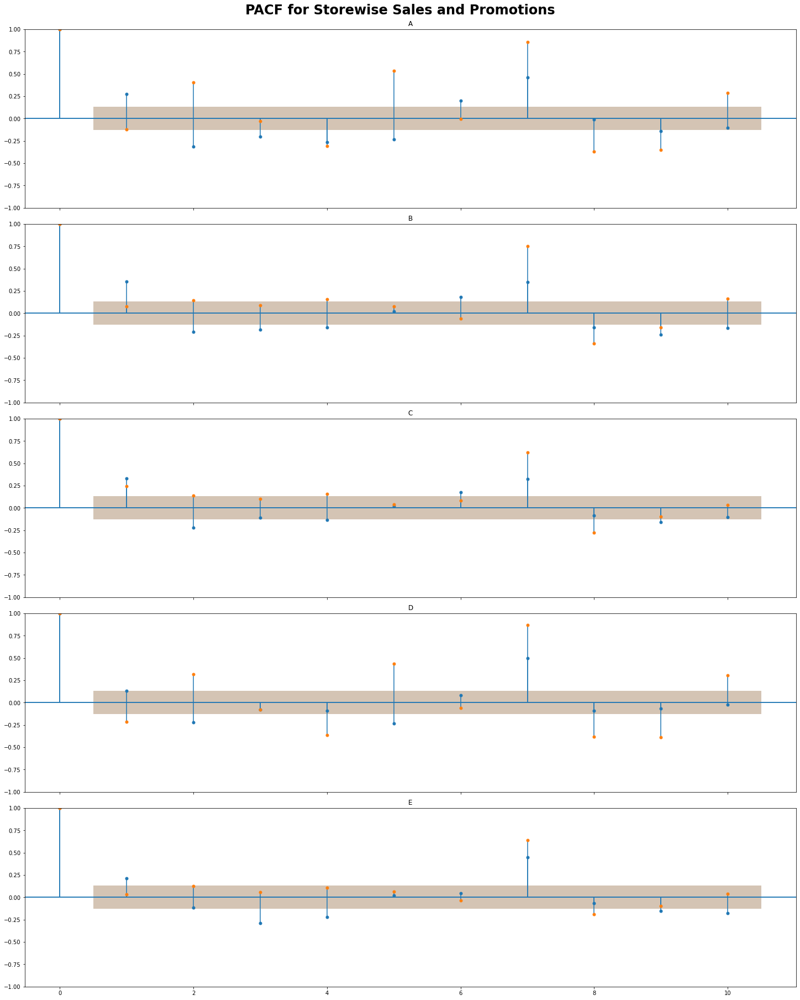

In [26]:
cols=1
rows=5
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 25),sharex=True,sharey=True,constrained_layout=True)
fig.suptitle("PACF for Storewise Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_store_s.columns)
colnames=['A','B','C','D','E']
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    plot_pacf(X_store_s[ticker],title=colnames[ticker],lags=10,ax=ax)
    plot_pacf(X_store_p[ticker],title=colnames[ticker],lags=10,ax=ax)

<h1 align="center"> Part 3: </h1>

___

### **Grouping sales by ```store_nbr``` :**
___



In [27]:
storenbr_sales=data.copy()
storenbr_sales['date']=storenbr_sales.date.dt.to_period('D')
storenbr_sales=storenbr_sales.set_index(['store_nbr','date']).sort_index()
storenbr_sales=(
    storenbr_sales
    .groupby(['store_nbr','date'])
    .mean() 
    .unstack('store_nbr')
    .loc['2017', ['sales', 'onpromotion']]
)

Acquiring sales and onpromotion separately:

In [28]:
X_storenbr_s=storenbr_sales.sales
X_storenbr_p=storenbr_sales.onpromotion

In [29]:
len(X_storenbr_s.columns)

54

### **Periodogram for ```store_nbr```**
___

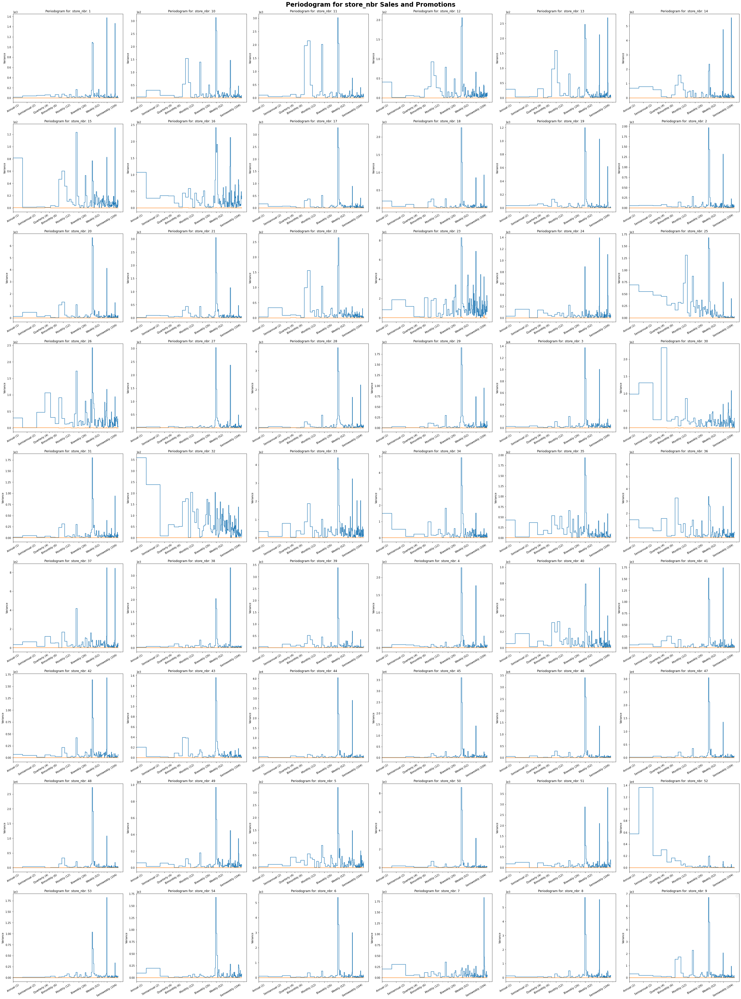

In [30]:
cols=6
rows=9
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(40, 54),sharex=False,sharey=False,constrained_layout=True)
fig.suptitle("Periodogram for store_nbr Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_storenbr_s.columns)
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    # filter df for ticker and plot on specified axes
    plot_periodogram(X_storenbr_s[ticker],For=f'store_nbr: {ticker}',ax=ax,color='C0') # fft = fast fourier transform
    plot_periodogram(X_storenbr_p[ticker],For=f'store_nbr: {ticker}',ax=ax,color='C1') # alpha If a number is given, the confidence intervals for the given level are returned. For instance if alpha=.05, 95 % confidence intervals are returned where the standard deviation is computed according to Bartlett’s formula.
    plt.legend()

### **ACF plot for ```store_nbr```**
___

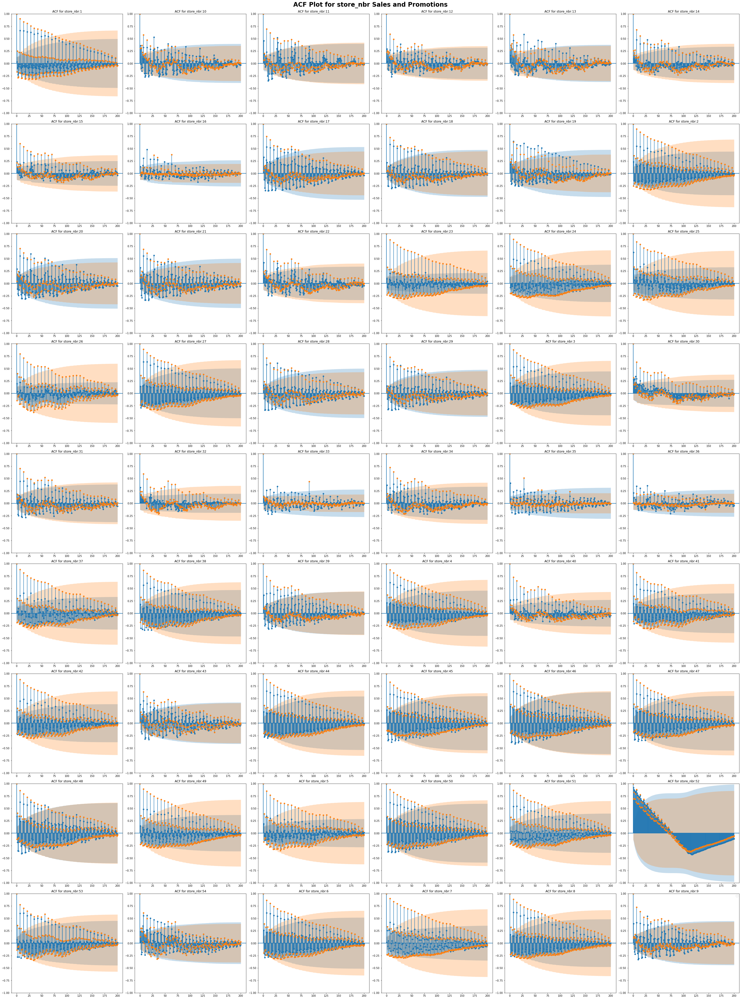

In [31]:
cols=6
rows=9
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(40, 54),sharex=False,sharey=False,constrained_layout=True)
fig.suptitle("ACF Plot for store_nbr Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_storenbr_s.columns)
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    # filter df for ticker and plot on specified axes
    plot_acf(X_storenbr_s[ticker],alpha=0.05,title=f'ACF for store_nbr:{ticker}',fft=False,lags=200,ax=ax) # fft=fast fourier transform
    plot_acf(X_storenbr_p[ticker],alpha=0.05,title=f'ACF for store_nbr:{ticker}',fft=False,lags=200,ax=ax)# alpha If a number is given, the confidence intervals for the given level are returned. For instance if alpha=.05, 95 % confidence intervals are returned where the standard deviation is computed according to Bartlett’s formula.
    plt.legend()

### **PACF Plot for ```store_nbr```**
___

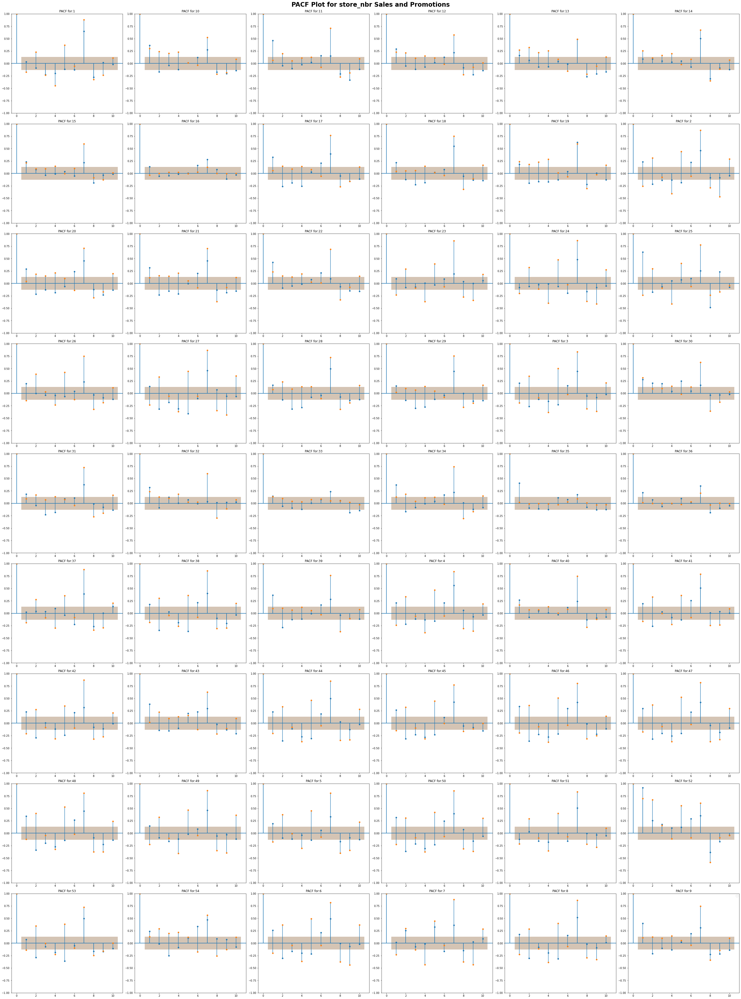

In [32]:
cols=6
rows=9
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(40, 54),sharex=False,sharey=False,constrained_layout=True)
fig.suptitle("PACF Plot for store_nbr Sales and Promotions", fontsize=24,fontweight='bold')
tickers=list(X_storenbr_s.columns)
count=0
for ticker, ax in zip(tickers, axs.ravel()):
    # filter df for ticker and plot on specified axes
    plot_pacf(X_storenbr_s[ticker],title=f'PACF for:{ticker}',lags=10,ax=ax) # fit fourier Ture
    plot_pacf(X_storenbr_p[ticker],title=f'PACF for:{ticker}',lags=10,ax=ax)# alpha If a number is given, the confidence intervals for the given level are returned. For instance if alpha=.05, 95 % confidence intervals are returned where the standard deviation is computed according to Bartlett’s formula.
    plt.legend()

### EDA Remarks
---
* It looks like different ```family``` and ```store_nbr``` shows different patterns of sales and promotions some show randomness, some show seasonal patterns and some show trends.
* In contrast ```store_type``` shows similarity amongst sales patterns, traces of both trend and seasonality can be found in the ACF plots and also almost identical periodogram suggests that the average sales based on which store type we are looking at tends to correlate the most.
* Also another indicator for sales are onpromotion sales. They line up most of the time in pacf and acf plots, sometimes inversely  to each other.

### Modelling Decisions
___

1. Sales on ```store_types``` are rather similar in describing non-stationarity in the data than the Sales grouped by ```family``` and ```store_nbr```, so we are going to use ```store_types``` as our indicator.
2. Periodogram of ```store_types``` for all the stores shows similar seasonality, so it would be good to generalize frequency that fits all of them well. In contrast ```family``` and ```store_nbr``` periodograms are not good at generalizing periods.
3. Partial Auto Correlation plot suggests that the 7<sup>th</sup> order of lags are better at explaining current price for almost all the stores. That means it lines up with our strong weekly seasonality referendum of the all the Periodograms. In contrast ```family``` and ```store_nbr``` PACF are not good at generalizing the order of frequency in the sales.
4. Since there are both Trend and Seasonality indicators, we might have to use a hybrid model with DirRec Strategy.

> We look to implement a model that is going to generalize on all the data rather than just handpicking and overfitting to just one product category. 
So, it is very important to choose an indicator that shows similar pattern on non-stationarity in the data regardless, that way we can neutralize the patterns and introduce stationarity in the overall data.


# Modelling
___

<h1 align="center"><strong> Part 1: </strong> Solutions with - <code> Seasonal Model </code> </h1> 

___


In [33]:
storewise_sales=data.copy()
storewise_sales['date']=storewise_sales.date.dt.to_period('D')
storewise_sales=storewise_sales[['store_nbr', 'store_type','date','sales']]
storewise_sales=storewise_sales.set_index(['store_nbr', 'store_type','date']).sort_index()
storewise_sales=(
    storewise_sales
    .groupby(['store_nbr','store_type','date'])
    .mean()
).fillna(0)

In [34]:
y=storewise_sales.unstack(['store_nbr', 'store_type'])
fourier = CalendarFourier(freq='W', order=1)
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=7,
    seasonal=True,
    additional_terms=[fourier],
    drop=True,
)
X = dp.in_sample()
X['NewYear'] = (X.index.dayofyear == 1)
# X['Holiday'] = hol
model = LinearRegression(fit_intercept=False)
model.fit(X, y)
y_pred = pd.DataFrame(model.predict(X), index=X.index, columns=y.columns)

In [35]:
df_test = pd.merge(test,stores,how='left',on='store_nbr').rename(columns={'type':'store_type'})
df_test['date'] = df_test.date.dt.to_period('D')
df_test['store_type']=le.fit_transform(df_test['store_type'])
df_test = df_test.set_index(['date','store_nbr', 'store_type']).sort_index()
df_test=df_test[['id','onpromotion']]

In [36]:
X_test = dp.out_of_sample(steps=16)
X_test.index.name = 'date'  
X_test['NewYear'] = (X_test.index.dayofyear == 1)

In [37]:
# y_submit=pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)
# y_submit = y_submit.stack(['store_nbr', 'store_type'])
# y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales']).dropna(axis=0)
# y_submit=y_submit.astype({'id': 'int64'})
# y_submit.to_csv('./submission.csv',index=False)

<h1 align="center"> <strong> Part 2: </strong> Solutions with - <code> Hybrid Models </code> </h1> 

___

In [38]:
# You'll add fit and predict methods to this minimal class
class BoostedHybrid:
    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None  # store column names from fit method
def fit(self, X_1, X_2, y):
    # YOUR CODE HERE: fit self.model_1
    self.model_1.fit(X_1,y)

    y_fit = pd.DataFrame(
        # YOUR CODE HERE: make predictions with self.model_1
        self.model_1.predict(X_1),
        index=X_1.index, columns=y.columns,
    )

    # YOUR CODE HERE: compute residuals
    y_resid = y-y_fit
    y_resid = y_resid.stack().squeeze() # wide to long
    # YOUR CODE HERE: fit self.model_2 on residuals
    self.model_2.fit(X_2, y_resid)

    # Save column names for predict method
    self.y_columns = y.columns
    # Save data for question checking
    self.y_fit = y_fit
    self.y_resid = y_resid
    

# Add method to class
BoostedHybrid.fit = fit

def predict(self, X_1, X_2):
    y_pred = pd.DataFrame(
        # YOUR CODE HERE: predict with self.model_1
        self.model_1.predict(X_1),
        index=X_1.index, columns=self.y_columns,
    )
    y_pred = y_pred.stack().squeeze()  # wide to long

    # YOUR CODE HERE: add self.model_2 predictions to y_pred
    y_pred += self.model_2.predict(X_2)
    
    return y_pred.unstack()  # long to wide


# Add method to class
BoostedHybrid.predict = predict

## **Getting the training data**

In [39]:
sales=pd.merge(data.astype({'store_nbr':int}),transactions,how='left',on=['date','store_nbr'])
# sales=data.copy()
sales['date']=sales.date.dt.to_period('D')
sales= sales[['store_type','store_nbr','date','sales','onpromotion']].copy()
sales['store_nbr']=sales.store_nbr.astype(int)
sales = sales.set_index(['date','store_type','store_nbr']).sort_index()

sales = (
    sales
    .groupby(['date','store_nbr'])
    .mean()
    .unstack(['store_nbr'])
)

## Precprocessing the Targets and Features

* ```X_1``` for Trend Features.
* ```X_2``` for Seasonality Features.
* ```y``` for target

In [40]:
y = sales.loc[:,'sales']

In [41]:
# Target series
dp = DeterministicProcess(index=y.index,order=2)

X_1 = dp.in_sample()

X_2 = sales.drop('sales', axis=1).stack(['store_nbr']).clip(0.0) # onpromotion feature

le = LabelEncoder()  

X_2 = X_2.reset_index(['store_nbr','date'])
X_2 = pd.merge(X_2, stores[['store_nbr','type']].astype({'store_nbr':int}),how='left',on='store_nbr').rename(columns={'type':'store_type'})
X_2['store_type'] = le.fit_transform(X_2['store_type'])
X_2=X_2.set_index('date')
X_2['onpromotion'] = np.sqrt(X_2.onpromotion)
X_2["dayofweek"] = X_2.index.dayofweek  
X_2["month"]=X_2.index.month
X_2["week"] = X_2.index.weekofyear 
X_2["NewYear"]=(X_2.index.dayofyear==1).astype(int)
X_2["SemiWeek"]=(X_2.index.dayofweek==(1 or 5)).astype(int)
X_2["Biweek"] = (X_2.index.weekofyear%2==0).astype(int)
X_2["dayofmonth"] = X_2.index.day
X_2["quarter"]=X_2.index.quarter
X_2

,store_nbr,onpromotion,store_type,dayofweek,month,week,NewYear,SemiWeek,Biweek,dayofmonth,quarter
date,,,,,,,,,,,
2013-01-01,1,0.000000,3,1,1,1,1,1,0,1,1
2013-01-01,2,0.000000,3,1,1,1,1,1,0,1,1
2013-01-01,3,0.000000,3,1,1,1,1,1,0,1,1
2013-01-01,4,0.000000,3,1,1,1,1,1,0,1,1
2013-01-01,5,0.000000,3,1,1,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,50,2.132007,0,1,8,33,0,1,0,15,3
2017-08-15,51,1.961756,0,1,8,33,0,1,0,15,3
2017-08-15,52,2.074375,0,1,8,33,0,1,0,15,3


In [42]:
X_1

,trend,trend_squared
date,,
2013-01-01,1.0,1.0
2013-01-02,2.0,4.0
2013-01-03,3.0,9.0
2013-01-04,4.0,16.0
2013-01-05,5.0,25.0
...,...,...
2017-08-11,1680.0,2822400.0
2017-08-12,1681.0,2825761.0
2017-08-13,1682.0,2829124.0


In [43]:
leads7=make_leads(X_2.onpromotion,leads=15).fillna(0)
for i in leads7.columns:
    X_2[i]=leads7[i]    
X_2

,store_nbr,onpromotion,store_type,dayofweek,month,week,NewYear,SemiWeek,Biweek,dayofmonth,...,y_lead_9,y_lead_8,y_lead_7,y_lead_6,y_lead_5,y_lead_4,y_lead_3,y_lead_2,y_lead_1,y_lead_0
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1,0.000000,3,1,1,1,1,1,0,1,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01,2,0.000000,3,1,1,1,1,1,0,1,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01,3,0.000000,3,1,1,1,1,1,0,1,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01,4,0.000000,3,1,1,1,1,1,0,1,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01,5,0.000000,3,1,1,1,1,1,0,1,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,50,2.132007,0,1,8,33,0,1,0,15,...,0.0,0.0,0.0,0.0,0.0,2.486326,1.858641,2.074375,1.961756,2.132007
2017-08-15,51,1.961756,0,1,8,33,0,1,0,15,...,0.0,0.0,0.0,0.0,0.0,0.000000,2.486326,1.858641,2.074375,1.961756
2017-08-15,52,2.074375,0,1,8,33,0,1,0,15,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,2.486326,1.858641,2.074375


###  **Fitting the model**

In [44]:
model = BoostedHybrid(Lasso(),XGBRegressor(alpha=0.6,gamma=220))

### **Train & Validation Split**

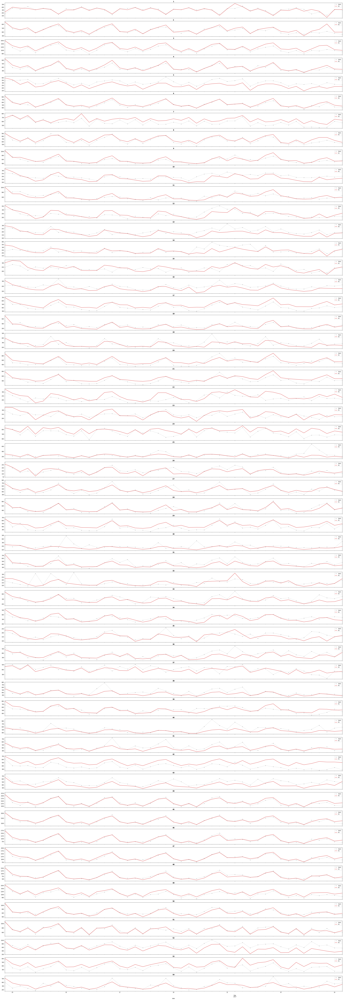

In [45]:
y_train, y_valid = y[:"2017-07-01"], y["2017-07-02":]
X1_train, X1_valid = X_1[:"2017-07-01"], X_1["2017-07-02" :]
X2_train, X2_valid = X_2.loc[:"2017-07-01"], X_2.loc["2017-07-02":]

model.fit(X1_train, X2_train, y_train)
y_fit = model.predict(X1_train, X2_train).clip(0.0)
y_pred = model.predict(X1_valid, X2_valid).clip(0.0)
store_types = y.columns
axs = y_valid.loc(axis=1)[store_types].plot(label='train',
    subplots=True, sharex=True, figsize=(50, 150), **plot_params, alpha=0.5,
)
# _ = y_fit.loc(axis=1)[store_types].plot(label='fit',subplots=True, sharex=True, color='C0', ax=axs)
_ = y_pred.loc(axis=1)[store_types].plot(label='pred',subplots=True, sharex=True, color='C3', ax=axs)

for ax, store_type in zip(axs, store_types):
    ax.legend(['train','fit','pred'])
    ax.set_title(store_type,fontweight='bold')

<AxesSubplot:title={'center':'Periodogram'}, ylabel='Variance'>

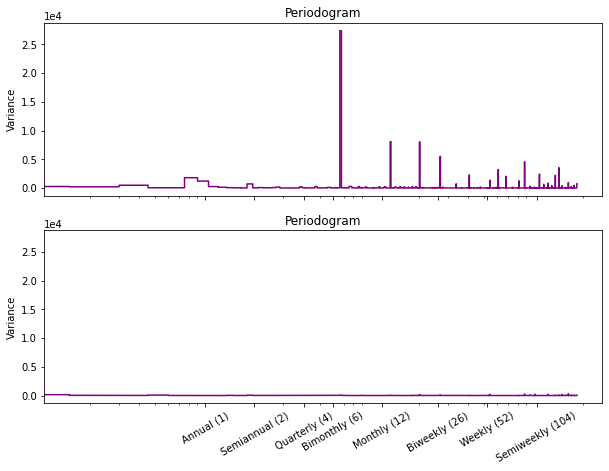

In [46]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 7))
plot_periodogram(y_valid.stack(),ax=ax1)
plot_periodogram((y_valid-y_pred).stack(),ax=ax2)

### **Input for linear model**

In [47]:
X1_test = dp.out_of_sample(16)

### **Input for ```XGBoostRegressor()``` model**

In [48]:
X2_test=test[['date','store_nbr','onpromotion']].astype({'store_nbr':int}).copy()
X2_test['date']=X2_test.date.dt.to_period('D')

X2_test = X2_test.set_index(['date','store_nbr']).sort_index()
X2_test = (
    X2_test
    .groupby(['date','store_nbr'])
    .mean())
X2_test = X2_test.reset_index(['date','store_nbr'])
X2_test = pd.merge(X2_test,stores[['store_nbr','type']].astype({'store_nbr':int}),how='left',on='store_nbr').rename(columns={'type':'store_type'})
X2_test['store_type']=le.fit_transform(X2_test['store_type'])
X2_test=X2_test.set_index('date')
X2_test["dayofweek"] = X2_test.index.dayofweek 
X2_test["month"] = X2_test.index.month
X2_test["week"] = X2_test.index.weekofyear
X2_test["NewYear"]=(X2_test.index.dayofyear==1).astype(int)
X2_test["SemiWeek"]=(X2_test.index.dayofweek==(1 or 5)).astype(int)
X2_test["Biweek"] = (X2_test.index.weekofyear%2==0).astype(int)
X2_test["dayofmonth"] = X2_test.index.day
X2_test["quarter"]=X2_test.index.quarter
X2_test #day type

,store_nbr,onpromotion,store_type,dayofweek,month,week,NewYear,SemiWeek,Biweek,dayofmonth,quarter
date,,,,,,,,,,,
2017-08-16,1,15.878788,3,2,8,33,0,0,0,16,3
2017-08-16,2,15.939394,3,2,8,33,0,0,0,16,3
2017-08-16,3,15.454545,3,2,8,33,0,0,0,16,3
2017-08-16,4,15.787879,3,2,8,33,0,0,0,16,3
2017-08-16,5,15.636364,3,2,8,33,0,0,0,16,3
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-31,50,6.030303,0,3,8,35,0,0,0,31,3
2017-08-31,51,5.333333,0,3,8,35,0,0,0,31,3
2017-08-31,52,6.090909,0,3,8,35,0,0,0,31,3


In [49]:
lag7=make_leads(X2_test.onpromotion,leads=15).fillna(0)
for i in lag7.columns:
    X2_test[i]=lag7[i]    
X2_test

,store_nbr,onpromotion,store_type,dayofweek,month,week,NewYear,SemiWeek,Biweek,dayofmonth,...,y_lead_9,y_lead_8,y_lead_7,y_lead_6,y_lead_5,y_lead_4,y_lead_3,y_lead_2,y_lead_1,y_lead_0
date,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1,15.878788,3,2,8,33,0,0,0,16,...,19.060606,18.151515,15.515152,15.939394,15.424242,15.636364,15.787879,15.454545,15.939394,15.878788
2017-08-16,2,15.939394,3,2,8,33,0,0,0,16,...,18.757576,19.060606,18.151515,15.515152,15.939394,15.424242,15.636364,15.787879,15.454545,15.939394
2017-08-16,3,15.454545,3,2,8,33,0,0,0,16,...,18.484848,18.757576,19.060606,18.151515,15.515152,15.939394,15.424242,15.636364,15.787879,15.454545
2017-08-16,4,15.787879,3,2,8,33,0,0,0,16,...,18.969697,18.484848,18.757576,19.060606,18.151515,15.515152,15.939394,15.424242,15.636364,15.787879
2017-08-16,5,15.636364,3,2,8,33,0,0,0,16,...,18.575758,18.969697,18.484848,18.757576,19.060606,18.151515,15.515152,15.939394,15.424242,15.636364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-31,50,6.030303,0,3,8,35,0,0,0,31,...,0.000000,0.000000,0.000000,0.000000,0.000000,4.363636,4.636364,6.090909,5.333333,6.030303
2017-08-31,51,5.333333,0,3,8,35,0,0,0,31,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.363636,4.636364,6.090909,5.333333
2017-08-31,52,6.090909,0,3,8,35,0,0,0,31,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.363636,4.636364,6.090909


### **Preprocessing the ```test``` dataset for submission.**

In [50]:
df_test = pd.merge(test.astype({'store_nbr':int}),stores[['store_nbr','type']].astype({'store_nbr':int}),how='left',on='store_nbr').rename(columns={'type':'store_type'})
df_test['date'] = df_test.date.dt.to_period('D')
df_test['store_type']=le.fit_transform(df_test['store_type'])
df_test = df_test.set_index(['date', 'store_type','store_nbr']).sort_index()
df_test=df_test[['id','onpromotion']]

### **Submission**

In [51]:
y_sub=pd.DataFrame(model.predict(X1_test,X2_test))


y_sub.index=y_sub.index.rename('date')
y_fore = y_sub.copy()
y_sub=y_sub.stack().to_frame(name='sales')
y_sub=pd.merge(df_test['id'],y_sub['sales'],how='left', on=['date','store_nbr']).fillna(0)
y_sub.to_csv('./submission.csv',index=False)



# y_sub = y_sub.join(df_test.id).reindex(columns=['id', 'sales'])
# y_sub = y_sub.set_index(['id'])
# y_sub = y_sub.sort_values('id')
# y_sub = y_sub.reset_index(['id'])
# y_sub.to_csv('./submission.csv',index=False)

### **Plotting the forecast**

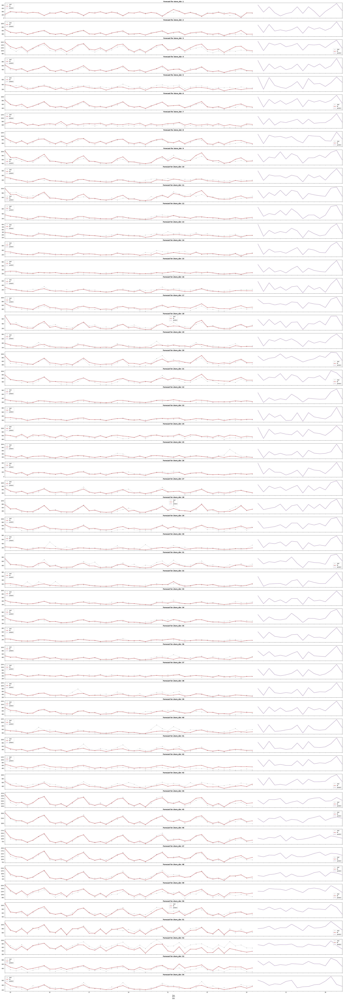

In [52]:
store_types = y.columns

axs = y_valid.loc(axis=1)[store_types].plot(
    subplots=True, sharex=True, figsize=(50, 150), **plot_params, alpha=0.5,
)
# _ = y_fit.loc(axis=1)[store_types].plot(subplots=True, sharex=True, color='C0', ax=axs)
_ = y_pred.loc(axis=1)[store_types].plot(subplots=True,style='.-', sharex=True, color='C3', ax=axs)
_ = y_fore.loc(axis=1)[store_types].plot(subplots=True, sharex=True, color='C4', ax=axs)
for ax, store_type in zip(axs, store_types):
    ax.legend(['real','fit','predict','forecast'])
    ax.set_title(f'Forecast for store_nbr: {store_type}',fontweight='bold')

### Next we add 'store_nbr' feature to the model